# <font color='darkblue'>YouTube Video Statistics 2017 - 2018 </font>

#### <font color='darkblue'>Project by Sofi Khachatryan, Gor Yeghiazaryan, Veronika Khachatryan, Veronika Petrosyan



#### YouTube has become the most famous platform for sharing video content, with 2.6 billion users worldwide.
#### Via millions of videos uploaded daily, YouTube has created an opportunity for content creators to acquire an 
#### enormous audience and earn money. The ability to track and analyze video characteristics is critical for 
#### understanding the performance of YouTube videos. In this project, we study a dataset containing information 
#### about the top trending videos on YouTube published from November 2017 till June 2018. The dataset includes 
#### information about video titles, channels, views, likes, dislikes, comments, tags, etc. The project aims to 
#### gain insights into the factors affecting a video's popularity and whether these aspects differ across videos. 
#### This understanding can enable  content creators and YouTube channel owners to optimize their 
#### video content and enhance their performance on the platform. 

In [74]:
import pandas as pd
import regex
import numpy as np
import matplotlib.pyplot as plt
import re
from wordcloud import WordCloud
import seaborn as sns
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from datetime import datetime
import plotly as py
import plotly.subplots as sp
import plotly.graph_objs as go
import plotly.express as px
import plotly.offline as pyo
import ipywidgets as widgets

In [45]:
data = pd.read_csv('CAvideos.csv')
data

,video_id,trending_date,title,channel_title,category_id,publish_time,tags,views,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,video_error_or_removed,description
0,n1WpP7iowLc,17.14.11,Eminem - Walk On Water (Audio) ft. Beyoncé,EminemVEVO,10,2017-11-10T17:00:03.000Z,"Eminem|""Walk""|""On""|""Water""|""Aftermath/Shady/In...",17158579,787425,43420,125882,https://i.ytimg.com/vi/n1WpP7iowLc/default.jpg,False,False,False,Eminem's new track Walk on Water ft. Beyoncé i...
1,0dBIkQ4Mz1M,17.14.11,PLUSH - Bad Unboxing Fan Mail,iDubbbzTV,23,2017-11-13T17:00:00.000Z,"plush|""bad unboxing""|""unboxing""|""fan mail""|""id...",1014651,127794,1688,13030,https://i.ytimg.com/vi/0dBIkQ4Mz1M/default.jpg,False,False,False,STill got a lot of packages. Probably will las...
2,5qpjK5DgCt4,17.14.11,"Racist Superman | Rudy Mancuso, King Bach & Le...",Rudy Mancuso,23,2017-11-12T19:05:24.000Z,"racist superman|""rudy""|""mancuso""|""king""|""bach""...",3191434,146035,5339,8181,https://i.ytimg.com/vi/5qpjK5DgCt4/default.jpg,False,False,False,WATCH MY PREVIOUS VIDEO ▶ \n\nSUBSCRIBE ► http...
3,d380meD0W0M,17.14.11,I Dare You: GOING BALD!?,nigahiga,24,2017-11-12T18:01:41.000Z,"ryan|""higa""|""higatv""|""nigahiga""|""i dare you""|""...",2095828,132239,1989,17518,https://i.ytimg.com/vi/d380meD0W0M/default.jpg,False,False,False,I know it's been a while since we did this sho...
4,2Vv-BfVoq4g,17.14.11,Ed Sheeran - Perfect (Official Music Video),Ed Sheeran,10,2017-11-09T11:04:14.000Z,"edsheeran|""ed sheeran""|""acoustic""|""live""|""cove...",33523622,1634130,21082,85067,https://i.ytimg.com/vi/2Vv-BfVoq4g/default.jpg,False,False,False,🎧: https://ad.gt/yt-perfect\n💰: https://atlant...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40876,sGolxsMSGfQ,18.14.06,HOW2: How to Solve a Mystery,Annoying Orange,24,2018-06-13T18:00:07.000Z,"annoying orange|""funny""|""fruit""|""talking""|""ani...",80685,1701,99,1312,https://i.ytimg.com/vi/sGolxsMSGfQ/default.jpg,False,False,False,🚨 NEW MERCH! http://amzn.to/annoyingorange 🚨➤ ...
40877,8HNuRNi8t70,18.14.06,Eli Lik Lik Episode 13 Partie 01,Elhiwar Ettounsi,24,2018-06-13T19:01:18.000Z,"hkayet tounsia|""elhiwar ettounsi""|""denya okhra...",103339,460,66,51,https://i.ytimg.com/vi/8HNuRNi8t70/default.jpg,False,False,False,► Retrouvez vos programmes préférés : https://...
40878,GWlKEM3m2EE,18.14.06,KINGDOM HEARTS III – SQUARE ENIX E3 SHOWCASE 2...,Kingdom Hearts,20,2018-06-11T17:30:53.000Z,"Kingdom Hearts|""KH3""|""Kingdom Hearts 3""|""Froze...",773347,25900,224,3881,https://i.ytimg.com/vi/GWlKEM3m2EE/default.jpg,False,False,False,Find out more about Kingdom Hearts 3: https://...
40879,lbMKLzQ4cNQ,18.14.06,Trump Advisor Grovels To Trudeau,The Young Turks,25,2018-06-13T04:00:05.000Z,"180612__TB02SorryExcuse|""News""|""Politics""|""The...",115225,2115,182,1672,https://i.ytimg.com/vi/lbMKLzQ4cNQ/default.jpg,False,False,False,Peter Navarro isn’t talking so tough now. Ana ...


### `video_id`: The unique identifier for each video. 
### `trending_date`: The date when the video was listed as a top trending video on YouTube. 
### `title`: The title of the video. 
### `channel_title`: The name of the YouTube channel that posted the video.
### `category_id`: The numeric identifier for the category of the video (see below for more details on category IDs). 
### `publish_time`: The date and time when the video was originally published on YouTube. 
### `tags`: A list of keywords or tags associated with the video, separated by commas. 
### `views`: The total number of views that the video has received.
### `likes`: The total number of likes that the video has received. 
### `dislikes`: The total number of dislikes that the video has received. 
### `comment_count`: The total number of comments that the video has received. 
### `thumbnail_link`: A link to the thumbnail image for the video.
### `comments_disabled`: A boolean value indicating whether comments have been disabled for the video. 
### `ratings_disabled`: A boolean value indicating whether ratings have been disabled for the video. 
### `video_error_or_removed`: A boolean value indicating whether the video has been removed or deleted by YouTube. 
### `description`: A brief description of the video.

In [46]:
category_dict = {
    1: 'Film & Animation',
    2: 'Autos & Vehicles',
    10: 'Music',
    15: 'Pets & Animals',
    17: 'Sports',
    18: 'Short Movies',
    19: 'Travel & Events',
    20: 'Gaming',
    21: 'Videoblogging',
    22: 'People & Blogs',
    23: 'Comedy',
    24: 'Entertainment',
    25: 'News & Politics',
    26: 'Howto & Style',
    27: 'Education',
    28: 'Science & Technology',
    29: 'Nonprofits & Activism',
    30: 'Movies',
    31: 'Anime/Animation',
    32: 'Action/Adventure',
    33: 'Classics',
    34: 'Comedy',
    35: 'Documentary',
    36: 'Drama',
    37: 'Family',
    38: 'Foreign',
    39: 'Horror',
    40: 'Sci-Fi/Fantasy',
    41: 'Thriller',
    42: 'Shorts',
    43: 'Shows',
    44: 'Trailers'
}

# Apply the dictionary to the category_id column
data['category_id'] = data['category_id'].map(category_dict)

In [47]:
removed_videos = data.groupby('category_id')['video_error_or_removed'].sum().sort_values(ascending=False).reset_index()

fig = px.bar(removed_videos, x='category_id', y='video_error_or_removed',
             title='Number of Videos Removed by Category', color='category_id',
             color_discrete_sequence=px.colors.qualitative.Pastel)

for i in range(len(removed_videos)):
    fig.add_annotation(x=removed_videos['category_id'][i], y=removed_videos['video_error_or_removed'][i],
                       text=str(removed_videos['video_error_or_removed'][i]), showarrow=False, font=dict(size=12))

fig.update_layout(xaxis_title='Category ID', yaxis_title='Number of Videos Removed', 
                  xaxis_tickangle=-45, xaxis_tickmode='linear', xaxis_dtick=1)

fig.show()

The output of the code shows that the "Film & Animation" category has the highest number of deleted videos, followed by "Entertainment" and "Other". The other categories such as "Politics", "Games", and "Movies" etc were not deleted as many times.

This can be attributed to the fact that the "Film & Animation" and "Entertainment" categories are among the most popular categories on YouTube, and thus may receive a higher volume of user-generated content, some of which may violate YouTube's content policies. It is also possible that the content in these categories may be more likely to generate controversy or violate copyright laws, which may lead to videos being removed.


Our analysis found that the information on whether a video has been removed, or included an error in it,  and  Video_id and Thumbnail_link
did not impact the popularity of the channels. Therefore, we dropped the row named "video_error_or_removed" to clear
the data and make it visually more convenient.


In [48]:
data.drop(['video_id', 'thumbnail_link', 'video_error_or_removed'], axis=1, inplace=True)


to find out which words used in title and tag names gained the most popularity, 
we needed to clear the strings, so they would not include punctuation, preposition, and articles.

In [100]:
data.loc[:, 'title'] = data.loc[:, 'title'].apply(lambda x: re.sub(r'[^\w\s]', '', x.lower()).strip())
data.loc[:, 'tags'] = data.loc[:, 'tags'].str.replace('|', ' ')
data.loc[:, 'tags'] = data.loc[:, 'tags'].apply(lambda x: re.sub(r'[^\w\s]', '', x.lower()).strip())

# Remove articles and prepositions from title and tags columns
words = ['a', 'an', 'the', 'about', "and ", "is", "i", "you", 'above', 'across', 'after', 'against', 'along', 'among', 'around', 'at', 'before', 'behind', 'below', 'beneath', 'beside', 'between', 'beyond', 'by', 'despite', 'down', 'during', 'except', 'for', 'from', 'in', 'inside', 'into', 'like', 'near', 'of', 'off', 'on', 'onto', 'out', 'outside', 'over', 'past', 'since', 'through', 'throughout', 'till', 'to', 'toward', 'under', 'underneath', 'until', 'up', 'upon', 'with', 'within', 'without']

for word in words:
    regex = r'\b{}\b'.format(word)
    data['title'] = data['title'].apply(lambda x: re.sub(regex, '', x))
    data['tags'] = data['tags'].apply(lambda x: re.sub(regex, '', x))

C:\Users\armin\AppData\Local\Temp\ipykernel_13784\2575244763.py:2: FutureWarning:

The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.



In [50]:
print(data.isnull().sum())


trending_date           0
title                   0
channel_title           0
category_id             0
publish_time            0
tags                    0
views                   0
likes                   0
dislikes                0
comment_count           0
comments_disabled       0
ratings_disabled        0
description          1296
dtype: int64


Nans are in the discription column and we don't want to replace them as they don't interfere the flow of our code

In [101]:
# get the top 10 channels by number of vidoes posted 
channel_counts = data['channel_title'].value_counts()
top_channels = channel_counts[:10]
print(top_channels)

# create a bar plot of channel counts
fig = px.bar(top_channels, x=top_channels.index, y=top_channels.values, color=top_channels.values, color_continuous_scale='Burg')
fig.update_layout(title='Top 10 Channels by Number of Videos',
                  xaxis_title='Channel Name',
                  yaxis_title='Number of videos ')
fig.show()


SET India                             192
MSNBC                                 189
FBE                                   188
The Young Turks                       186
REACT                                 183
VikatanTV                             182
CNN                                   182
The Late Show with Stephen Colbert    172
RadaanMedia                           168
ARY Digital                           168
Name: channel_title, dtype: int64


The code gives us an idea of which channels are the most popular on YouTube based on the dataset. We can conclude that the
SET India  channel is the most common with a count of 192. The majority of top channels are TV channels or
media networks that produce news or entertainment content
Based on the given list of channels and their counts, 
it appears that these channels have a high number of videos that have gone viral and 
have been viewed by a large number of people. 
For example, channels like SET India, MSNBC, and CNN are channels that produce regular news content, 
which could explain their high view counts. Channels like FBE and The Young Turks produce reaction videos, 
which are popular among younger audiences. RadaanMedia and ARY Digital produce content for South Asian audiences, 
which could explain their high view counts.
In conclusion, the popularity of these channels could be due to a combination of factors 
such as the content they produce, their target audience, and the overall quality of their videos.

In [52]:
# get the top 10 channels by total view count
views = data.groupby('channel_title')['views'].sum()
top_channels = views.nlargest(10)

# create a bar plot of channel views
fig = px.bar(top_channels, x=top_channels.index, y=top_channels.values, color=top_channels.values, color_continuous_scale='Sunsetdark')
fig.update_layout(title='Top 10 Channels by Total Views',
                  xaxis_title='Channel Name',
                  yaxis_title='Total Views')
fig.show()

The output gives us the sum of the total views for each channel, sorted in descending order. 
It tells us which channels have the most views in total across all their videos in the dataset.
From this output, we can conclude that Marvel Entertainment has the most views at over 1 billion, 
followed by T-Series with over 799 million views. We can also see that several of the top channels are related to music,
such as ibighit, ChildishGambinoVEVO, and T-Series, indicating that music content is very popular on YouTube. 
Other top channels like Dude Perfect, PewDiePie, and YouTube Spotlight are popular creators or brands that produce a 
variety of content, including gaming, comedy, and other types of entertainment. Overall, this output
gives us a good sense of which channels are the most viewed on YouTube and the types of content that are popular among viewers.
Based on the output, we can conclude that viewers on YouTube have diverse tastes in the type of content they watch. 
The top channels include a variety of genres, including music (T-Series, ibighit, and ChildishGambinoVEVO), 
entertainment (Marvel Entertainment, YouTube Spotlight, and PewDiePie), sports (Dude Perfect), and film/television
(Sony Pictures Entertainment and 20th Century Fox).
This suggests that popular content on YouTube can be any form of entertainment or informational material. 
It is not limited to a specific genre or category. Additionally, we can see that the channels with the most
views are not necessarily the ones with the most subscribers, indicating that some videos or creators may 
have higher engagement and repeat viewership.

Looking at the outputs of the two codes, we can see that the most viewed channels are dominated by individual creators, 
such as PewDiePie and ChildishGambinoVEVO, as well as major media and entertainment companies,
like Marvel Entertainment and Sony Pictures Entertainment.

On the other hand, the most popular channels based on the number of videos produced are primarily TV 
channels or media networks, such as SET India, MSNBC, and CNN. This suggests that while these channels 
may not be producing content that is individually as popular as that of individual creators or major entertainment companies,
they are producing a high volume of content, which is generating a large number of views overall.

It's also interesting to note that there are a few channels that appear in both lists,
such as YouTube Spotlight and T-Series. This indicates that there are some channels that are both producing a 
high volume of content and generating a large number of views for each of their videos.

Overall, these differences in the most viewed and most popular channels suggest that there 
are multiple factors that contribute to a channel's success on YouTube, including both the quality and quantity of their content


In [53]:
fig = px.scatter(data, x='views', y='comment_count', size='views', color='views',
                 labels={
                     "comment_count": 'Number of Comments',
                     "views": 'Number of Views',
                 },
                title="Coorelation between Number of Views and Comments")
fig.show()

#The scatter plot of views vs number of comments doesn't show a clear correlation between the two variables. 
#Only thing we can clonclude from this graph is that the videos which has a lot of comments (more than avarage )
#tend to have a lot of views (600000000-1400000000 )

In [54]:
fig = px.scatter(data, x='views', y='comment_count', animation_frame='trending_date',
                 size='views', color='views',
                 labels={
                     "comment_count": 'Number of Comments',
                     "views": 'Number of Views',
                     'trending_date': 'Trending Date'
                 },
                title="Number of Views and Comments for every Trending Date")
fig.show()



each frame represents a different date in which the videos were trending. The x-axis shows the number of views of each video, the y-axis shows the number of comments, and the size and color of the markers are proportional to the number of views. The labels for the axes and the title of the plot are also specified in the code. The resulting plot allows the viewer to see how the number of views and comments change over time as videos trend on the platform.

In [21]:
likes_views_trace = go.Scatter(
    x=data['views'],
    y=data['likes'],
    mode='markers',
    name='Likes'
)
dislikes_views_trace = go.Scatter(
    x=data['views'],
    y=data['dislikes'],
    mode='markers',
    name='Dislikes'
)
layout = go.Layout(
    title='Likes and Dislikes vs Views Correlation',
    xaxis=dict(title='Views'),
    yaxis=dict(title='Count'),
    hovermode='closest'
)
fig = go.Figure(data=[likes_views_trace, dislikes_views_trace], layout=layout)

fig.update_traces(marker=dict(size=8, line=dict(width=1, color='White'), opacity=0.8))

fig.show()


Based on the given graph, we can see that there is a positive correlation between the number of views and the number of likes
for the videos in the dataset. We can also see that the number of dislikes is relatively small compared to the number of likes, 
indicating that the viewers mostly liked the videos.

The graph shows that as the number of views increases, the number of likes also increases.
However, we can also observe that the number of dislikes also slightly increases with the number of views, but the magnitude
of dislikes is much smaller compared to the likes. This suggests that viewers mostly enjoyed the videos in the dataset, 
as the number of likes is much higher than the number of dislikes.

In [96]:
category_counts = data['category_id'].value_counts()

colors1 = px.colors.qualitative.Pastel1  
colors2 = px.colors.qualitative.Pastel2  

combined_colors = colors1 + colors2

pie_trace = go.Pie(
    labels=category_counts.index,
    values=category_counts.values,
    textinfo='percent+label',
    hole=0.4,
    textposition='outside',
    marker=dict(
        colors=combined_colors
    )
)


fig = go.Figure(pie_trace)


fig.update_layout(
    title='Video Counts by Category',
    title_x=0.5,  
    width=800,
    height=600,
)

fig.show()

Based on the results, we can see that category 24 (Entertainment) has the highest number of video counts, accounting for 32.9% of all videos. This is followed by category 25 (News & Politics) with 10.2%, and category 22 (People & Blogs) with 10%.
It's possible that the high video count in category 24 is due to the popularity and demand for entertainment content among viewers. Similarly, the high video count in category 25 may be due to the interest in news and current events. On the other hand, the lower video counts in categories 29, 30, and 43 may suggest that these categories are less popular or have less content available on the platform.
Based on the given data, it can be observed that the "Movies" category has the lowest percentage of video counts at only 0.01%. This could be due to various reasons such as Limited audience: The movies category may have a limited target audience, as not everyone is interested in watching movies on YouTube. This could lead to lower demand and fewer creators producing content in this category on Youtube.

In [23]:
mean_views_df = data.groupby(['category_id']).mean().reset_index()
mean_views_df = mean_views_df.sort_values(by='views', ascending=False)
fig = px.bar(mean_views_df, x='category_id', y='views', title='Mean Views by Category',
             color='category_id',
            color_discrete_sequence=px.colors.qualitative.Pastel)
fig.update_layout(xaxis_title='Categories', yaxis_title='Mean Views')
category_selector = widgets.Dropdown(
    options=mean_views_df['category_id'].unique(),
    value=mean_views_df['category_id'].unique()[0],
    description='Category:'
)
def update_plot(category_id):
    filtered_data = mean_views_df[mean_views_df['category_id'] == category_id]
    fig.data[0].x = filtered_data['category_id']
    fig.data[0].y = filtered_data['views']
    fig.update_layout(title=f"Mean Views by Category")

widgets.interactive(update_plot, category_id=category_selector)

fig.show()


Based on the output, we can conclude that the category with the highest mean views is "Music" followed by "Movies". The categories with the lowest mean views are "Travel & Events", "News & Politics", and "Education".
This can give insights to content creators about which categories are more likely to get more views and engagement. For example, if a creator is deciding between creating content in the Education category versus the Music category, the data suggests that creating content in the Music category may lead to more views.
One possible reason for this trend is that YouTube is primarily used as a platform for entertainment and leisure activities rather than for educational or news-related purposes. Additionally, music and entertainment-related content is often more engaging than content related to travel, politics, or education, which could also explain why these categories have lower mean views.

In [24]:
views_by_category = data.groupby('category_id')['views'].sum().sort_values(ascending=False).reset_index()
views_by_category['category_name'] = views_by_category['category_id'].apply(lambda x: data[data['category_id'] == x]['category_id'].iloc[0])
pastel_colors = ['rgb(255,204,204)', 'rgb(255,204,153)', 'rgb(255,255,204)', 'rgb(204,255,204)', 'rgb(204,229,255)', 'rgb(255,204,255)']
fig1 = go.Figure(
    data=go.Bar(x=views_by_category['category_name'], y=views_by_category['views'], marker_color=pastel_colors),
    layout=go.Layout(title='Total Views by Category', xaxis={'title': 'Categories'}, yaxis={'title': 'Total Views'})
)
views_by_category = views_by_category.sort_values('views', ascending=False)
fig1 = px.bar(views_by_category, x='category_id', y='views', title='Total Views by Category',
             color='category_id',
            color_discrete_sequence=px.colors.qualitative.Pastel)

fig1.update_layout(xaxis_title='Categories', yaxis_title='Total Views')

category_selector = widgets.Dropdown(
    options=views_by_category['category_id'].unique(),
    value=views_by_category['category_id'].unique()[0],
    description='Category:'
)

def update_plot(category_id):
    filtered_data = views_by_category[views_by_category['category_id'] == category_id]
    fig1.data[0].x = filtered_data['category_id']
    fig1.data[0].y = filtered_data['views']
    fig1.update_layout(title=f"Total Views by Category")

widgets.interactive(update_plot, category_id=category_selector)

fig1.show()


Based on the analysis of the data, we can see that the categories with the highest mean views are music and movies. This indicates that on average, videos in these categories tend to receive more views compared to other categories. However, it's important to note that the number of videos in each category can also play a role in the mean views. For example, the movies category has fewer videos compared to other categories, which may contribute to its higher mean views.

On the other hand, when looking at the categories with the most overall views, we see that music and entertainment are the most popular categories. This suggests that while on average, music and movies tend to receive more views, there are more videos in the entertainment category that have amassed a large number of views, contributing to its overall popularity.

In [25]:
category = data[data['category_id'] == "Music"]
top10 = category['channel_title'].value_counts().head(10)
print("\033[1mTop 10 Music Channels by Count:\033[0m")
df = pd.DataFrame({'Channel Title': top10.index, 'Count': top10.values})
display(df.style.background_gradient(cmap='Blues'))
df = pd.DataFrame({'Channel Title': top10.index, 'Count': top10.values})
fig = px.bar(df, x='Channel Title', y='Count', color=top10.values, color_continuous_scale='Matter')
fig.update_layout(title='Top 10 Music Channels by Count', xaxis_title='Channel Title', yaxis_title='Count')
fig.show()

# Which music channels have the most views?
views_top = category.groupby('channel_title')['views'].sum()
dic = views_top.sort_values(ascending=False)[:10].to_dict()
print("\n\033[1mTop 10 Music Channels by Views:\033[0m")
df = pd.DataFrame({'Channel Title': list(dic.keys()), 'Views': list(dic.values())})
display(df.style.background_gradient(cmap='Blues'))

fig = px.bar(df, x='Channel Title', y='Views', color=list(dic.values()), color_continuous_scale='Matter')
fig.update_layout(title='Top 10 Music Channels by Views', xaxis_title='Channel Title', yaxis_title='Views')
fig.show()


Top 10 Music Channels by Count:


,Channel Title,Count
0,Speed Records,115
1,T-Series,81
2,T-Series Apna Punjab,76
3,WORLDSTARHIPHOP,74
4,Humble Music,63
5,White Hill Music,47
6,Lokdhun Punjabi,42
7,Geet MP3,40
8,Genius,38
9,EminemVEVO,37



Top 10 Music Channels by Views:


,Channel Title,Views
0,T-Series,799114025
1,ibighit,511567918
2,Speed Records,426604974
3,ChildishGambinoVEVO,411775069
4,Ed Sheeran,385566686
5,TaylorSwiftVEVO,374678625
6,EminemVEVO,326643776
7,WORLDSTARHIPHOP,260129303
8,NickyJamTV,242651158
9,MalumaVEVO,223335130


Firstly, we can see that T-Series is the most popular music channel with 799,114,025 total views. This is followed by ibighit, with 511,567,918 views, and Speed Records, with 426,604,974 views. This suggests that viewers have a strong preference for certain types of music and tend to gravitate towards channels that cater to their preferences.
Secondly, we can observe that the top music channels are not only popular within the music category, but also rank among the most viewed channels overall. For instance, T-Series is the second most viewed channel on YouTube, while ibighit and Speed Records are also among the top 100 most viewed channels. This suggests that music videos are widely popular on the platform and can generate large amounts of views.
One possible explanation for why T-Series and ibighit are the most viewed music channels is their content focus. T-Series is primarily known for producing Bollywood music, while ibighit is the label behind the popular Korean group BTS. Both Bollywood and K-Pop have large and dedicated fanbases around the world, which could explain the high view counts for these channels.
Speed Records is another channel that has a strong focus on regional content, with a focus on Punjabi music. Thus, The most popular channels are likely to be those that can consistently produce engaging and high-quality content that resonates with their audience. We can also see that some music channels are present in both outputs, such as T-Series and EminemVEVO. This suggests that these channels are consistently popular in terms of both video uploads and total views. 
the top 10 list for views have fewer videos compared to others. This can be explained by the fact that some channels produce fewer videos but they still manage to attract a large number of viewers. These channels may have a more targeted audience, and their videos may be highly anticipated, leading to a high number of views for each video they release. 
We can see that some of the channels with the highest number of views have a relatively low number of videos posted, while others have a very high number of videos. This suggests that the quality of the content and the popularity of the channel are more important factors in driving views than simply the number of videos posted.

In [69]:
titles = data["title"]
word_counts = {}
for title in titles:
    for word in title.split():
        word = word.lower()
        if word in word_counts:
            word_counts[word] += 1
        else:
            word_counts[word] = 1
sort = sorted(word_counts.items(), key=lambda x: x[1], reverse=True)
top_words = sort[:15]

titles = data['title']
wordcloud = WordCloud(background_color='white', width=512, height=384).generate(' '.join(titles))

plt.imshow(wordcloud)
plt.axis('off')
plt.savefig('Title-Word_Cloud.png')
plt.show()

The output shows the top 15 most frequently occurring words in the video titles. The word '2018' is the most frequent, followed by 'episode', 'official', 'vs' and 'full'. This suggests that a lot of the video titles are related to television series, music videos, and sports events. Additionally, words such as 'new', 'trailer' and 'ft' indicate that there is a lot of content related to new releases, movies, and collaborations. It's interesting to note that the word 'Trump' appears in the top 15, which suggests that politics might be a popular topic on YouTube. 
We can see that the top words in video titles include "2018", "episode", "official", "vs", "full", "video", and "game". This suggests that including these words in video titles may make them more popular.
For example, using "2018" in a video title can make it more attractive to viewers who are interested in the latest trends and updates. Using "episode" in a title can suggest that the video is part of a series or has a story arc, which may entice viewers to watch more. "Official" can indicate that the video is an authorized or authentic source of information, which may increase its credibility. "Vs" can imply a competition or comparison, which can make the video more intriguing. "Full" can suggest that the video is complete or uncut, which can appeal to viewers who want to see the full content. And "game" can suggest that the video is related to gaming, which is a popular niche on YouTube.

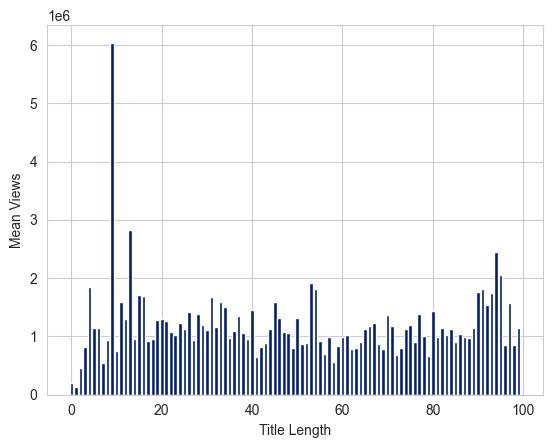

In [80]:

data['title_length'] = data['title'].apply(len)
title_length_views = data.groupby('title_length')['views'].mean()
plt.bar(title_length_views.index, title_length_views.values)
plt.xlabel('Title Length')
plt.ylabel('Mean Views')
plt.show()

The best lenght for title to gain highest views is 10

In [67]:
tags = data["tags"]
tag_counts = {}
for tag in tags:
    for word in tag.split():
        word = word.lower()
        if word in tag_counts:
            tag_counts[word] += 1
        else:
            tag_counts[word] = 1
sort= sorted(tag_counts.items(), key=lambda x: x[1], reverse=True)
top = sort[:15]
print(top)
tags = data["tags"]
all_tags = ' '.join(tags)

wordcloud = WordCloud (
                    background_color = 'white',
                    width = 512,
                    height = 384
                        ).generate(all_tags)

plt.imshow(wordcloud)
plt.axis('off')
plt.show()

[('the', 17431), ('2018', 10227), ('news', 9655), ('new', 8435), ('funny', 7993), ('show', 7065), ('video', 6369), ('songs', 6345), ('food', 6050), ('trump', 5710), ('tv', 5316), ('comedy', 5300), ('music', 5196), ('vs', 5192), ('punjabi', 4977)]


The output shows the top 15 tags that appear the most in the dataset. We can see that "2018" is the most common tag followed by "news", "new", "funny", "show", "video", "songs", "food", "trump", "tv", "comedy", "music", "vs", "punjabi", and "best". These tags can give an idea of what people are searching for or interested in watching on YouTube. Using these tags in video titles and descriptions can potentially make the videos more discoverable and popular among viewers.

In [84]:
#Does emojis in the description affect the number of views? 
emojis = []
for description in data['description']:
    if isinstance(description, str):
        description_emojis = regex.findall(r'\p{Emoji}', description)
        if len(description_emojis) > 0:
            emojis.append(1)
        else:
            emojis.append(0)
    else:
        emojis.append(0)
data['emojis'] = emojis
views_with_emojis = data[data['emojis'] == 1]['views'].mean()
views_without_emojis = data[data['emojis'] == 0]['views'].mean()
print(f"Mean views for videos with emojis: {views_with_emojis:.2f}")
print(f"Mean views for videos without emojis: {views_without_emojis:.2f}")



Mean views for videos with emojis: 1169788.34
Mean views for videos without emojis: 1031497.81


Based on the output, we can see that videos with emojis in the description have a slightly higher mean views value compared to videos without emojis. The mean views for videos with emojis is approximately 1,169,788.34, while the mean views for videos without emojis is approximately 1,031,497.81. 

In [85]:
videos_comments_disabled = len(data[data['comments_disabled'] == True])
print(videos_comments_disabled )
videos_ratings_disabled = len(data[data['ratings_disabled'] == True])
print(videos_ratings_disabled)

583
279


From the output, we can conclude that a significant number of videos in the dataset have their comments and ratings disabled. This could be due to various reasons such as the creator's preference, controversial content, or the video receiving too much negative feedback. Additionally, videos with disabled comments and ratings may receive less engagement and feedback from viewers compared to videos that allow comments and ratings. let's find out which categories mostly disable their comments to understand the reason behind it. 

In [86]:
mean_views_df = data.groupby(['category_id']).mean().reset_index()
mean_views_df = mean_views_df.sort_values(by='comments_disabled', ascending=False)
fig = px.bar(mean_views_df, x='category_id', y='comments_disabled', title='Mean Value Comments Disabled by Category',
             color='category_id',
            color_discrete_sequence=px.colors.qualitative.Pastel)
fig.update_layout(xaxis_title='Categories', yaxis_title='Comments Disabled')
category_selector = widgets.Dropdown(
    options=mean_views_df['category_id'].unique(),
    value=mean_views_df['category_id'].unique()[0],
    description='Category:'
)
def update_plot(category_id):
    filtered_data = mean_views_df[mean_views_df['category_id'] == category_id]
    fig.data[0].x = filtered_data['category_id']
    fig.data[0].y = filtered_data['comments_disabled']
    fig.update_layout(title=f"Mean Value Comments Disabled by Category")
widgets.interactive(update_plot, category_id=category_selector)

fig.show()

Based on the output and the visualization, we can see that news channels have the highest number of videos with disabled comments and ratings. This could be due to the sensitive nature of the news and the potential for controversial topics to be discussed in the comments. it appears that the Nonprofits & Activism category has the second highest percentage of disabled comments, indicating that disabling comments may be a common practice among creators in this category. This could be due to the sensitive nature of the content in this category or the desire of creators to avoid negative or controversial comments. On the other hand, we can see that music and entertainment channels have the lowest number of videos with disabled comments and ratings. This could be because the audience tends to be more positive and less likely to leave negative comments. Overall, this data can provide insight into the trends of comments and ratings being disabled in different categories of YouTube videos.

In [87]:
num_videos_with_disabled_comments = len(data[data['comments_disabled'] == True])
print("Number of videos with disabled comments:", num_videos_with_disabled_comments)
num_videos_with_ratings_disabled = len(data[data['ratings_disabled'] == True])
print("Number of videos with disabled ratings :", num_videos_with_ratings_disabled)

Number of videos with disabled comments: 583
Number of videos with disabled ratings : 279


In [88]:
views_disabled_comments = data[data['comments_disabled'] == True]['views'].mean()
views_enabled_comments = data[data['comments_disabled'] == False]['views'].mean()
print("Average views for videos with disabled comments:",(views_disabled_comments))
print("Average views for videos with enabled comments:", (views_enabled_comments))

Average views for videos with disabled comments: 1271768.6106346485
Average views for videos with enabled comments: 1145231.3754776912


The output shows that the videos with disabled comments have a higher average number of views (approximately 1,271,769 views) compared to videos with enabled comments (approximately 1,145,231 views). This could indicate that disabling comments on a video may generate more views, however, further analysis is needed to determine the cause-effect relationship between these variables.

In [89]:
# calculate the average number of views for videos without disabled comments
views_disabled_rat = data[data['ratings_disabled'] == True]['views'].mean()
views_enabled_rat = data[data['ratings_disabled'] == False]['views'].mean()
print("Average views for videos with disabled rating:",(views_disabled_rat))
print("Average views for videos with enabled rating:", (views_enabled_rat))

Average views for videos with disabled rating: 1382031.5089605735
Average views for videos with enabled rating: 1145421.1191074331


Based on the output of this code, it seems that videos with disabled ratings tend to have a higher average number of views compared to videos with enabled ratings. The average number of views for videos with disabled ratings is 1382031, while the average number of views for videos with enabled ratings is 1145421. However, it's important to note that this does not necessarily indicate a causal relationship between the two factors, as there could be other factors that are influencing the number of views.

In [90]:
data['trending_date'] = pd.to_datetime(data['trending_date'], format='%y.%d.%m')
data['weekday_name'] = data['trending_date'].dt.day_name()
weekday_cat_count = data.groupby(['weekday_name', 'category_id']).size().reset_index(name='count')

fig = px.bar(weekday_cat_count, x='weekday_name', y='count', color='category_id', color_discrete_sequence=px.colors.qualitative.Pastel,
title='Count of Trending Videos by Category and Weekday [Complete Graph]', labels={'weekday_name': 'Weekday', 'count': 'Count'},
barmode='group', category_orders={'weekday_name': ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']})
fig.show()

In [91]:
data['trending_date'] = pd.to_datetime(data['trending_date'], format='%y.%d.%m')
data['weekday_name'] = data['trending_date'].dt.day_name()
weekday_cat_count = data.groupby(['weekday_name', 'category_id']).size().reset_index(name='count')

fig = px.bar(weekday_cat_count, x='weekday_name', y='count', animation_frame="category_id", range_x=['Monday', 'Sunday'], range_y=[0, 1500],
color='category_id', color_discrete_sequence=px.colors.qualitative.Pastel,
title='Count of Trending Videos by Category and Weekday for Each Category', labels={'weekday_name': 'Weekday', 'count': 'Count'},
barmode='group', category_orders={'weekday_name': ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']})
fig.show()


We checked whether publishers have a specific preferable weekday which can help to understand which weakday is betterfor posting a video via this code. For example, most of the videos were posted on Saturday in the Comedy category. On the other hand, in the Entertainment category, the most published day was Tuesday. Based on the graphs, different categories have different days of publishing the greatest amount of videos. Therefore, there is no particular weekday on which publishers post more videos compared to other days. As well as, there are no huge jumps on the charts, and stability remains between the weekdays for each category separately. 

In [92]:
#Doing this to individualy understand for each category
data['trending_date'] = pd.to_datetime(data['trending_date'], format='%y.%d.%m')
data['month'] = data['trending_date'].dt.month_name()
category_month_count = data.groupby(['category_id', 'month']).agg({'views': 'mean'}).reset_index()

fig = px.bar(category_month_count, x='month', y='views', color='category_id', color_discrete_sequence=px.colors.qualitative.Pastel,
title='Average Views of Trending Videos of Each Category Depending on the Month [Complete Graph]', labels={'month': 'Month', 
                                                                       'views': 'Average Views'},
barmode='group', category_orders={'month': ['November', 'December', 'January', 'February', 'March', 'April', 'May', 'June']})
fig.show()


In [93]:
#Doing individualy for each category to understand better
data['trending_date'] = pd.to_datetime(data['trending_date'], format='%y.%d.%m')
data['month'] = data['trending_date'].dt.month_name()
category_month_count = data.groupby(['category_id', 'month']).agg({'views': 'mean'}).reset_index()

fig = px.bar(category_month_count, x='month', y='views', animation_frame="category_id", range_x=['November', 'June'], range_y=[0, 2000000],         
             color='category_id', 
             color_discrete_sequence=px.colors.qualitative.Pastel,
title='Average Views of Trending Videos of Each Category Depending on the Month', labels={'month': 'Month', 
                                                                       'views': 'Average Views'},
barmode='group', category_orders={'month': ['November', 'December', 'January', 'February', 'March', 'April', 'May', 'June']})
fig.show()

which  months are good for posting video in each category: our data included only 7 months so here are some findings for music best month in june for non profit and activism organizations best month is january and the  least favorable month is may for Entertainment the highest is December, for Movies June and the other monts mostly empty. But we must note that this data is not a representative for all videos as we had only few data about Movies.
As we can see the jumps here are higher than in weekdays. 

In [94]:
corr_matrix = data[['views', 'likes', 'dislikes', 'comment_count']].corr()
fig = go.Figure(data=go.Heatmap(z=corr_matrix.values,
                                 x=corr_matrix.index.values,
                                 y=corr_matrix.columns.values,
                                 colorscale='Mint',
                                 colorbar=dict(title='Correlation')))
for i in range(len(corr_matrix.index)):
    for j in range(len(corr_matrix.columns)):
        fig.add_annotation(x=corr_matrix.index[i], y=corr_matrix.columns[j],
                           text=str(round(corr_matrix.values[i][j], 2)),
                           showarrow=False, font=dict(color='black'))
fig.update_layout(title='Correlation Matrix of YouTube Metrics')
fig.show()


This code calculates the correlation matrix between four variables: views, likes, dislikes, and comment_count. Correlation matrix shows how strongly pairs of variables are related to each other. The heatmap function from the seaborn library is then used to visualize the correlation matrix. The values in each cell of the heatmap represent the correlation coefficient between two variables. The higher the value, the stronger the correlation. From the heatmap, we can see that likes and views have a strong positive correlation, which means that as likes increase, views also tend to increase. Similarly, there is a strong positive correlation between likes and comment_count.A correlation coefficient of 0.46 between likes and dislikes indicates a moderate positive correlation between these two variables. This means that when the number of likes increases, the number of dislikes is also likely to increase to some extent, and vice versa. However, the strength of the correlation is not very strong, indicating that other factors also play a role in determining the number of likes and dislikes a video receives. The correlation coefficient of 0.56 between dislikes and views suggests a moderate positive correlation between these two variables. This means that as the number of dislikes for a video increases, the number of views tends to increase as well. However, it's important to note that correlation does not imply causation, and there could be other factors at play that affect both variables, such as the topic or quality of the video. The correlation between likes and views is a bit higher than the correlation between dislikes and views, indicating a stronger relationship between these two variables. This suggests that videos with more views tend to have more likes, and videos with fewer views tend to have fewer likes. Additionally, this may suggest that viewers who enjoy a video are more likely to like it, which can contribute to more views and engagement.

In [95]:
data['trending_date'] = pd.to_datetime(data['trending_date'], format='%y.%d.%m')
data['publish_time'] = pd.to_datetime(data['publish_time'], format='%Y-%m-%dT%H:%M:%S.%fZ')
data['publish_weekday'] = data['publish_time'].dt.day_name()
data['publish_hour'] = data['publish_time'].dt.hour
df_grouped = data.groupby(['publish_weekday', 'publish_hour'])['views'].mean().reset_index()
heatmap_data = df_grouped.pivot(index='publish_weekday', columns='publish_hour', values='views')
fig = px.imshow(heatmap_data,
                x=['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23'],
                y=['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'],
                color_continuous_scale="Brwnyl",
                labels={'x': 'Hour of Publishing Time', 'y': 'Weekday of Publishing Date', 'color': 'Average Views'},
                title='Average Views by Publishing Time')
fig.update_layout(xaxis=dict(tickmode='linear', dtick=1))

fig.show()


The chart clearly shows the correlation between weekdays, average views, and publishing time. The bold squares show the proper times for posting. Based on the graph, we can conclude that the most appropriate time for publishing a video to get the greatest amount of viewers is Monday, 9 o'clock.

We have created prediction models to predict the number of views based on different features. While our prediction models have shown promising results in predicting the number of views for trending videos on YouTube, it's important to note that this data only represents a small subset of videos on the platform. Trending videos often have established audiences and built-in fan bases, which may not be representative of the wider range of videos posted on YouTube. As such, these models may not accurately predict the performance of all videos on the platform. It's also important to consider other factors that may influence video performance, such as timing of uploads, content quality, and promotional strategies.

In [ ]:
X = data[['likes', 'dislikes', 'comment_count']]
y = data['views']
model = LinearRegression()
model.fit(X, y)
likes = int(input('Enter the number of likes: '))
dislikes = int(input('Enter the number of dislikes: '))
comments = int(input('Enter the number of comments: '))
new_data = [[likes, dislikes, comments]]
prediction = model.predict(new_data)

print(f'The predicted number of views is {prediction[0]}')

This function aims to create a linear regression model to predict the number of views on a YouTube video based on the number of likes, dislikes, and comments. It then takes user input for the number of likes, dislikes, and comments on a new video and uses the trained model to predict the number of views that new video is likely to receive.

In [ ]:
data['publish_time'] = pd.to_datetime(data['publish_time'], format='%Y-%m-%dT%H:%M:%S.%fZ')
data['publish_month'] = data['publish_time'].dt.month
data['publish_day'] = data['publish_time'].dt.day
X = data[['publish_month', 'publish_day']]
y = data['views']
model = LinearRegression()
model.fit(X, y)
month = int(input('Enter the month published (e.g. 1 for January): '))
day = int(input('Enter the day published (e.g. 15): '))
new_data = [[month, day]]
prediction = model.predict(new_data)
print(f'The predicted number of views is {prediction[0]}')

The aim of this code is to predict the number of views of YouTube videos based on the day and month they were published. It uses linear regression to build a model based on the 'publish_day' and 'publish_month' features, and the 'views' target variable, using a dataset of YouTube videos. It then prompts the user to input the day and month a new video was published, and uses the trained model to predict the number of views the new video will receive.

In [ ]:
data['publish_time'] = pd.to_datetime(data['publish_time'], format='%Y-%m-%dT%H:%M:%S.%fZ')
data['publish_weekday'] = data['publish_time'].dt.weekday
X = data[['publish_weekday']]
y = data['views']
model = LinearRegression()
model.fit(X, y)
weekday = int(input('Enter the weekday published (0 for Monday, 1 for Tuesday, etc.): '))
new_data = [[weekday]]
prediction = model.predict(new_data)
print(f'The predicted number of views is {prediction[0]}')


This code aims to predict the number of views of YouTube videos based on the weekday they were published. 

Project Report

Project Title: Analysis of YouTube Trending Videos Dataset

Project Overview: The project's goal was to examine a dataset containing statistics on the most popular YouTube videos posted between November 2017 and June 2018. The goal was to learn more about the elements affecting a video's popularity and determine whether these elements varied between various videos. The results of this investigation were meant to help YouTube channel owners and content producers optimize their video content and boost their success on the internet.


Summary of the some essential findings and Conclusions:


The findings of appropriate months, weekdays, and times for publishing videos to gain the most popularity.

Difference between Most Viewed and Most Popular Channels and possible reasons .

Aprroriate lenght for high views.

The most popular categories: music, entertainment, and gaming, while categories such as news and politics were less popular. This indicates that viewers are likely to engage with videos that provide entertainment or value in their free time.

The prediction models that are used to give predictions based on different factors. 

Conclusions about the most popular words used in titles and tags.

Correlation between different factors.

And more other findings mentioned in the code below

If the dataset contained not only the counts of the comments but the content of them as well, we could check the polarity of the comments and find out the videos with positive and negative feedback. That examination would help content creators improve the feedback for their videos and to avoid negativity.